# CA4015 Advanced Machine Learning - Assignment 1: Diabetes Classification

This assignment involves the Diabetes dataset found [here](https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database?resource=download). The objective is to predict the "Outcome" variable using two approaches.

1. Random Forests in scikit-learn
2. AutoML with PyCaret

This Notebook will be broken down into a number of sections:

* [Importing Libraries and packages](#lib)
* [Domain Exploration](#domain)
* [Dataset Overview](#data)
* [Exploratory Data Analysis](#eda)
* [Data Processing](#proc)
* [Baseline Model](#baseline)
* [Classification using Random Forests](#rf)
* [Classification using AutoML](#automl)

## Importing Libraries and Packages <a class="anchor" id="lib"></a>

In [2]:
pip install mlextend

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement mlextend
ERROR: No matching distribution found for mlextend


In [3]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, learning_curve, validation_curve, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.inspection import permutation_importance
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import RFE

%matplotlib inline

## Dataset Overview <a class="anchor" id="data"></a>

In [4]:
pwd #C:\\Users\\Diarmuid\\Documents\\dcu\\final-year\\ca4015\\Assignments\\ca4015_a1_diabetes

'C:\\Users\\Diarmuid\\Documents\\dcu\\final-year\\ca4015_machine_learning\\Assignments\\ca4015_a1_diabetes'

In [5]:
df = pd.read_csv('data/diabetes.csv')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [7]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

* Pregnancies: Number of times pregnant
* Glucose: Plasma glucose concentration at 2 hours in an oral glucose tolerance test (mg/dl)
* BloodPressure: Diastolic blood pressure (mm Hg)
* SkinThickness: Triceps skin fold thickness (mm)
* Insulin: 2-Hour serum insulin (mu U/ml)
* BMI: Body mass index (weight in kg/(height in m))
* DiabetesPedigreeFunction: Diabetes pedigree function
* Age: years
* Outcome: Class variable (0 or 1) 268 of 768 are 1, the others are 0

## Domain Exploration <a class="anchor" id="domain"></a>

### Pima Indians and Dataset Background
Pima indians are a Native group that live in Mexico and Arizona, US that have a high prevalence of type 2 diabetes. The prevalence of diabetes in the Mexican Pima Indians (6.9%) is less than one-fifth that in the US Pima Indians (38%). The Mexican Pima Indians are more physically active than US Pima Indians. This revelation lead to the idea that environmental factors have a stronger influence on type 2 diabetes than genetic, therefore, the chronic disease is largly preventable. [Source: NCBI](https://pubmed.ncbi.nlm.nih.gov/16873794/)

![Figure 1 presents the prevalence of diabetes in Pima and non-Pima Indians in Mexico and US](./images/pima_indian_diabetes.jpeg "Prevalence of diabetes in Pima and non-Pima Indians in Mexico and US")

[Source: Diabetes Journal](https://diabetesjournals.org/care/article/29/8/1866/28611/Effects-of-Traditional-and-Western-Environments-on)
### Diabetes
"Diabetes is a chronic (long-lasting) health condition that affects how your body turns food into energy.

Your body breaks down most of the food you eat into sugar (glucose) and releases it into your bloodstream. When your blood sugar goes up, it signals your pancreas to release insulin. Insulin acts like a key to let the blood sugar into your body’s cells for use as energy.

With diabetes, your body doesn’t make enough insulin or can’t use it as well as it should. When there isn’t enough insulin or cells stop responding to insulin, too much blood sugar stays in your bloodstream. Over time, that can cause serious health problems, such as heart disease, vision loss, and kidney disease." [Source: CDC](https://www.cdc.gov/diabetes/basics/diabetes.html#:~:text=With%20diabetes%2C%20your%20body%20either,releases%20it%20into%20your%20bloodstream.)

This means that factors like insulin and glucose are expected to play an important part in predicting diabetes.

### Gestational Diabetes
"Gestational diabetes occurs when your body can’t make enough insulin during your pregnancy. Insulin is a hormone made by your pancreas that acts like a key to let blood sugar into the cells in your body for use as energy.

During pregnancy, your body makes more hormones and goes through other changes, such as weight gain. These changes cause your body’s cells to use insulin less effectively, a condition called insulin resistance. Insulin resistance increases your body’s need for insulin.

All pregnant women have some insulin resistance during late pregnancy. However, some women have insulin resistance even before they get pregnant. They start pregnancy with an increased need for insulin and are more likely to have gestational diabetes." [Source: CDC](https://www.cdc.gov/diabetes/basics/gestational.html#:~:text=Insulin%20resistance%20increases%20your%20body's,likely%20to%20have%20gestational%20diabetes.)

Pregnancies are relevant here because more pregnancies may increase likelihood of developing gestational diabetes. The dataset details do not explicitly say what type of diabetes the women have.

### Glucose levels
"A low blood sugar level is uncommon in people who do not have diabetes." [Source: NHS](https://www.nhs.uk/conditions/low-blood-sugar-hypoglycaemia/)

This information will help during Exploratory Data Analysis and when interpreting the results of the algorithm.

### Fasting Blood Sugar Test
"This measures your blood sugar after an overnight fast (not eating). A fasting blood sugar level of 99 mg/dL or lower is normal, 100 to 125 mg/dL indicates you have prediabetes, and 126 mg/dL or higher indicates you have diabetes." [Source: CDC](https://www.cdc.gov/diabetes/basics/getting-tested.html#:~:text=A%20fasting%20blood%20sugar%20level,higher%20indicates%20you%20have%20diabetes.)

These ranges are important for detecting outliers during the cleaning and processing stage.

### Blood Pressure Range - Normal vs. Diabetic
"A normal blood pressure level is less than 120/80 mmHg.1" [Source: CDC](https://www.cdc.gov/bloodpressure/about.htm#:~:text=A%20normal%20blood%20pressure%20level%20is%20less%20than%20120%2F80%20mmHg.&text=No%20matter%20your%20age%2C%20you,pressure%20in%20a%20healthy%20range.)

"Readings vary, but most people with diabetes should have a blood pressure of no more than 130/80." [Source: WebMD](https://www.webmd.com/diabetes/high-blood-pressure)

Understanding the known ranges will assist us in outlier detection.

### Diastolic Blood Pressure (DBP)
"Extremely low or zero DBP is a possibility in cases of severe hypotension, stiff arteries in elderly, diabetes, arteriovenous malformation, and aortic dissection." [Source: IAForum](https://www.theiaforum.org/article.asp?issn=2589-7934;year=2016;volume=17;issue=1;spage=32;epage=33;aulast=Choudhary#:~:text=Extremely%20low%20or%20zero%20DBP,arteriovenous%20malformation%2C%20and%20aortic%20dissection.)

This will have to be considered during outlier detection.

### Tricep Skin Thickness
A study concluded that increased skin thickness was a risk factor for diabetes. [Source: NCBI](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6960014/)

### Insulin levels
"So a fasting insulin level should never be 0, which it might be in a person with untreated Type 1. It shouldn’t go below 3. But a high insulin level is just as problematic. A high insulin level is a sign of insulin resistance or prediabetes. It can also signify early-stage Type 2." [Source: Diabetes Self-Management](https://www.diabetesselfmanagement.com/blog/do-you-know-your-insulin-level/)

When investigating a 2-hour serum insulin (mu U/ml), I found one [paper](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3136064/) but I am unsure whether the units map to the units used here. In the study, the averages 18 and 69 found in control and case groups respectively and much lower than the levels found in the Insulin column.

### BMI
"patients with higher BMI are at higher risk for having diabetes mellitus" [Source: NCBI](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1890993/)
This is complements the point about skin thickness.

### Diabetes Pedigree Function
"Diabetes Pedigree Function: indicates the function which scores likelihood of diabetes based on family history." [Source: Analytics Vidhya](https://analyticsvidhya.com/blog/2021/07/diabetes-prediction-with-pycaret/)

### Age
"The risk for diabetes increases with age, making diabetes common in older adults." [Source: EndocrineWeb](https://www.endocrineweb.com/guides/diabetes-older-people/risk-rises-age)

## Exploratory Data Analysis <a class="anchor" id="eda"></a>

In [8]:
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Pandas Profiler: Correlation Heatmap and Multicollinearity
Correlated variables include:
- Glucose and Outcome
- Age and Pregnancy
- Insulin and Pregnancy (negative)
- Insulin and SkinThickness
- BMI and SkinThickness


In [9]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [10]:
# Creating binary columns to split the five variables into zero and non-zero to inspect the differences on Outcome
# False is non-zero
# True is zero
df = df.eval('HasInsulin = Insulin == 0')
df = df.eval('HasBP = BloodPressure == 0')
df = df.eval('HasGlucose = Glucose == 0')
df = df.eval('HasBMI = BMI == 0')
df = df.eval('HasSkinThickness = SkinThickness == 0')

False    0.513021
True     0.486979
Name: HasInsulin, dtype: float64


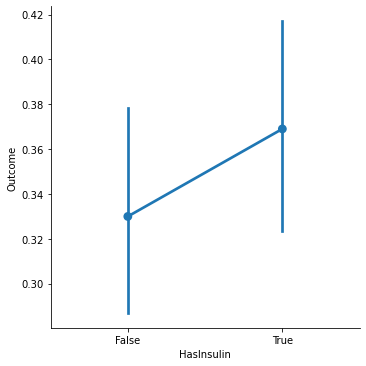

False    0.954427
True     0.045573
Name: HasBP, dtype: float64


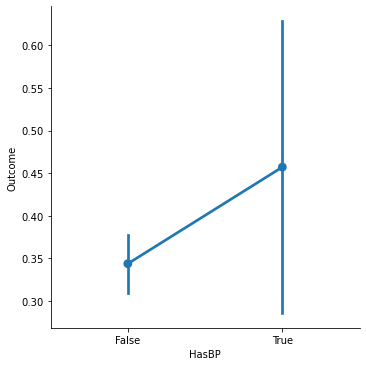

False    0.99349
True     0.00651
Name: HasGlucose, dtype: float64


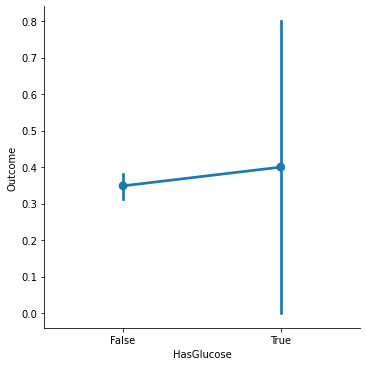

False    0.985677
True     0.014323
Name: HasBMI, dtype: float64


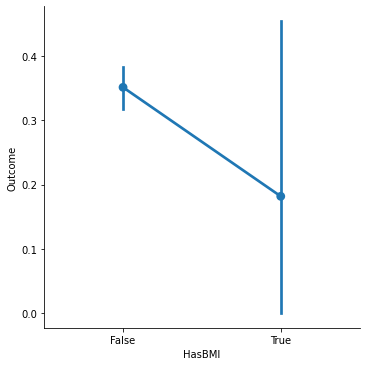

False    0.704427
True     0.295573
Name: HasSkinThickness, dtype: float64


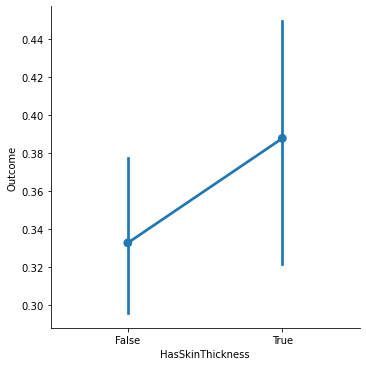

In [11]:
for col in ['HasInsulin', 'HasBP', 'HasGlucose', 'HasBMI', 'HasSkinThickness']:
    # This shows the proportion for zero and non-zero in each category
    print(df[col].value_counts(normalize=True))
    sns.catplot(data=df, x=col, y='Outcome', kind='point')
    plt.show()

### EDA Evaluation

- From EDA, glucose is most correlated with Outcome, BMI and Age show the highest correlation after. The other variables do not show much correlation.

- The presence of zeroes in Glucose, BloodPressure, SkinThickness, Insulin and BMI appear to be outliers due to how they clash with the overall distribution.

- Having a Glucose level, SkinThickness and BMI of 0 seems impossible, however I'm unsure if it is possible to have an Insulin and BloodPressure level of 0 due to the domain exploration above

- There are no significant differences in Outcome between zero and non-zero values who have levels equal to zero and those who don't.

- If we drop the 0 values (outliers), we will lose nearly 50% of the data due to Insulin and 30% of the data due to SkinThickness.

- Instead we will replace them with the mean to maintain the size of the dataset.

## Data Processing <a class="anchor" id="proc"></a>

In [12]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome', 'HasInsulin',
       'HasBP', 'HasGlucose', 'HasBMI', 'HasSkinThickness'],
      dtype='object')

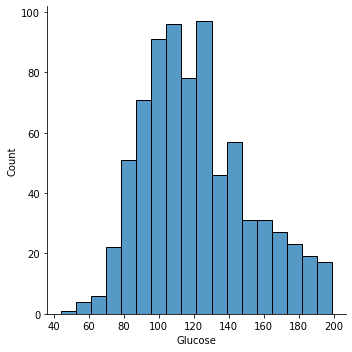

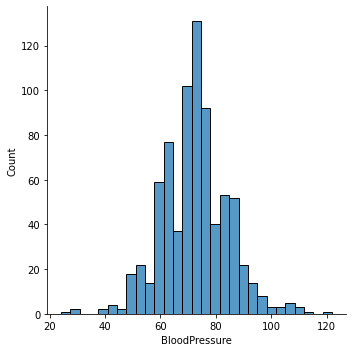

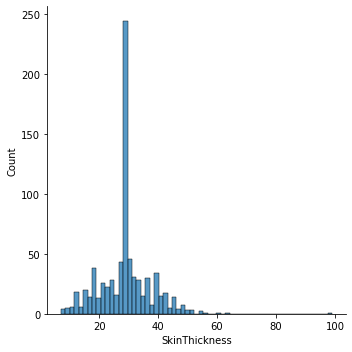

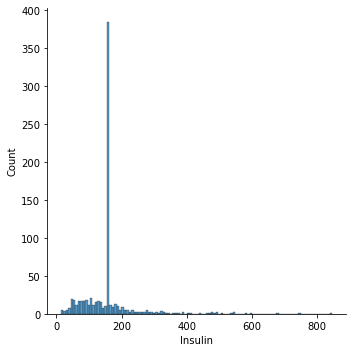

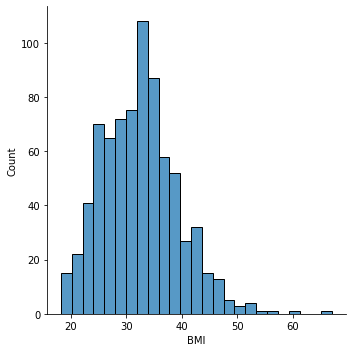

In [13]:
cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
for col in cols:
    mean = df.loc[df[col] > 0, col].mean()
    df[col] = np.where(df[col] == 0, mean, df[col])
    sns.displot(data=df, x=col, kind='hist')

### Visualising Outlier Detection

- SkinThickness and Insulin are highly right skewed. Let's explore there top values

<AxesSubplot:xlabel='SkinThickness'>

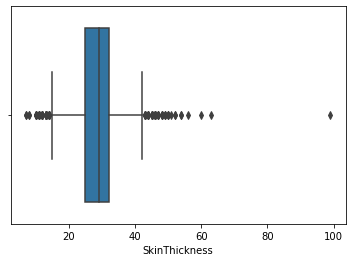

In [14]:
sns.boxplot(data=df, x='SkinThickness')

<AxesSubplot:xlabel='Insulin'>

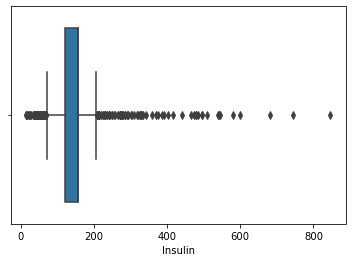

In [15]:
sns.boxplot(data=df, x='Insulin')

- SkinThickness of 99mm is a clear outlier. 
- Insulin has extreme values but not clear outliers

I will replace the SkinThickness but make no changes to Insulin

In [16]:
df.loc[df['SkinThickness'] == 99, 'SkinThickness'] = np.nan
df['SkinThickness'].fillna(df['SkinThickness'].median(), inplace=True)

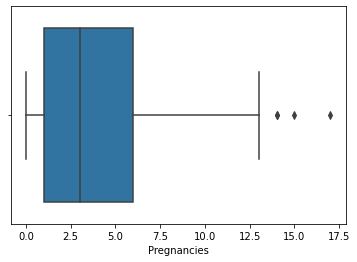

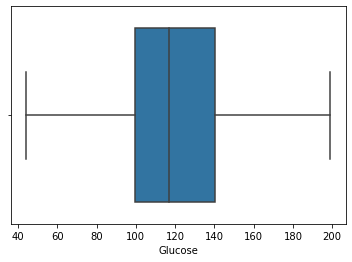

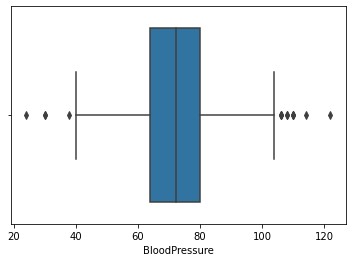

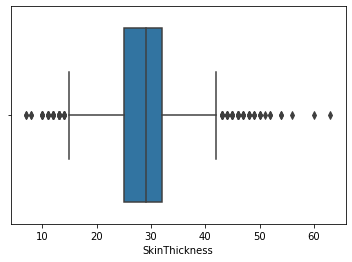

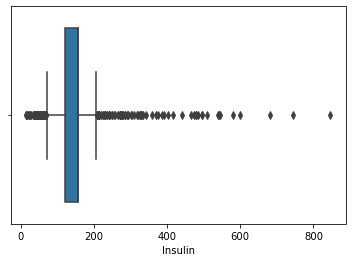

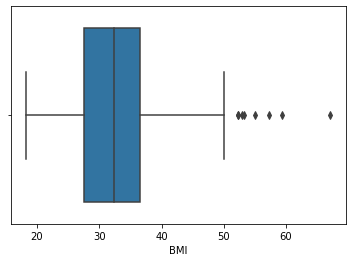

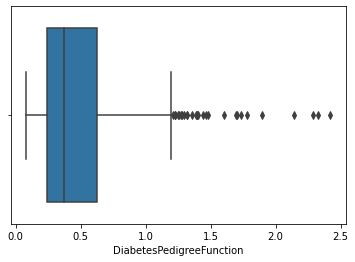

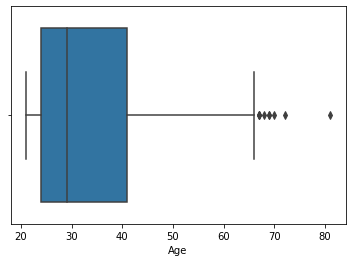

In [17]:
for col in df.columns[:8]:
    sns.boxplot(data=df, x=col)
    plt.show()

### Second PandasProfiler Report

In [18]:
report2 = ProfileReport(df[df.columns[:9]])
report2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Post-Processing Correlations**
- Glucose and Outcome
- Age and Pregnancy
- Age and BloodPressure
- BMI and SkinThickness

In [19]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,HasInsulin,HasBP,HasGlucose,HasBMI,HasSkinThickness
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1,True,False,False,False,False
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0,True,False,False,False,False
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1,True,False,False,False,True
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0,False,False,False,False,False
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1,False,False,False,False,False


## Classification using Random Forests <a class="anchor" id="rf"></a>

This section will be broken down into a number of parts
1. Running a random forest model out of the box
2. Analysing the validation curve
3. Analysing the learning curve
4. Performing grid search
5. Final Evaluation

When it comes to diagnosing diabetes, early intervention is important. Therefore false negatives (predicting a person doesn't have diabetes when they do) are more harmful than false positives (predicting a person has diabetes when they don't). We know among the female US Pima Indians population, there is over a 40% prevalence of diabetes. Moreover, diseases that are more common are more likely to have false negatives [Source: NCBI](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6297641/). As a result, recall (focuses on minimizing false negatives) and precision (focuses on minimizing false positives) of the diabetes class will need to be prioritised. Therefore F1 is a suitable measure to consider.

### Baseline Random Forest Model

In [34]:
# Splitting into independent and dependent variables
X = df[df.columns[:8]]
y = df['Outcome']

In [112]:
# Splitting the X and y into train and test data
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, random_state=np.random.seed(13))
print(f'Xtrain: {Xtrain.shape}')
print(f'Xtest: {Xtest.shape}')
print(f'ytrain: {ytrain.shape}')
print(f'ytest: {ytest.shape}')
print('This is a 25/75 split')

Xtrain: (576, 8)
Xtest: (192, 8)
ytrain: (576,)
ytest: (192,)
This is a 25/75 split


F1 Score: 0.595


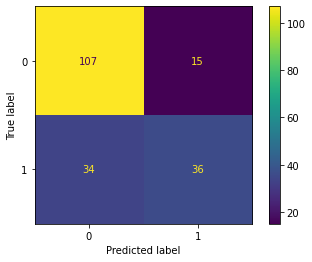

In [36]:
# Setting a random seed to reproduce the result
baseline_model = RandomForestClassifier(random_state=np.random.seed(13))
baseline_model.fit(Xtrain, ytrain)
ypred = baseline_model.predict(Xtest)
print(f'F1 Score: {f1_score(ytest, ypred).round(3)}')
cm = confusion_matrix(ytest, ypred, labels=baseline_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=baseline_model.classes_)
disp.plot()
plt.show()

After running RandomForestClassifier on its default parameters (with a random seed), an F1 score of 67% here was achieved. Over the following sections, we will explore how to improve this score.

### Feature Importance

Text(0.5, 1.0, 'Glucose Level possesses the strongest predictive power for Diabetes')

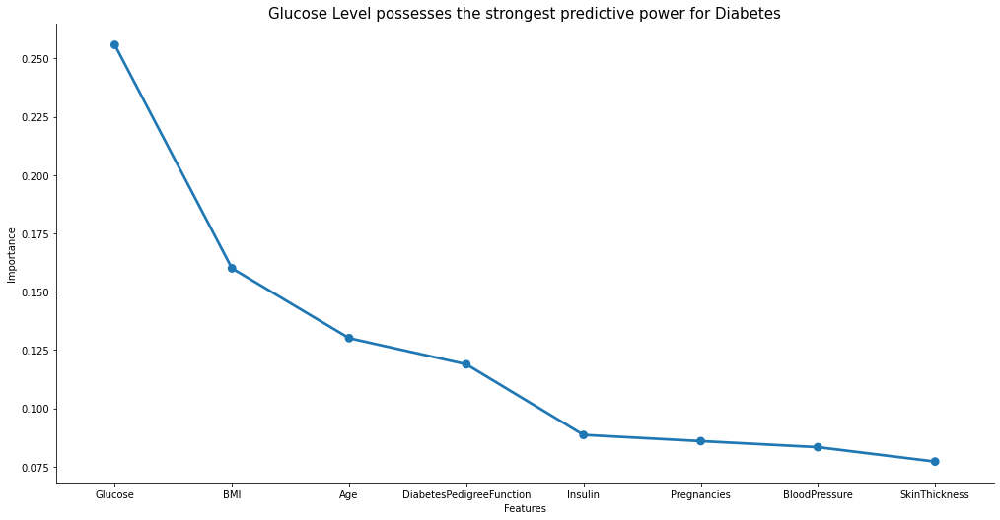

In [88]:
gini_importance = pd.DataFrame({'Features': Xtrain.columns, 'Importance': baseline_model.feature_importances_}).sort_values('Importance', ascending=False)
x = sns.catplot(data=gini_importance, x='Features', y='Importance', kind='point', height=7, aspect=2)
plt.title('Glucose Level possesses the strongest predictive power for Diabetes', fontsize=15)

In [89]:
features = gini_importance.Features.to_list()

### Forward selection
Using order of importance, a feature will be included in the moment one by one. The F1 scores will then be graphed. This is a simple example of forward selection

In [90]:
f1 = []
fs_model = RandomForestClassifier(random_state=np.random.seed(13))
for i in range(1,len(gini_importance) + 1):
    fs_model.fit(Xtrain[features[:i]], ytrain, )
    f1.append(f1_score(ytest, fs_model.predict(Xtest[features[:i]])))
gini_importance['F1_gini'] = f1

gini_importance

,Features,Importance,F1_gini
1,Glucose,0.255805,0.518519
5,BMI,0.160027,0.577778
7,Age,0.130099,0.601504
6,DiabetesPedigreeFunction,0.118902,0.656934
4,Insulin,0.088625,0.609375
0,Pregnancies,0.085963,0.622951
2,BloodPressure,0.083367,0.645161
3,SkinThickness,0.077211,0.614173


Based on the graph above, once Age is added F1 does not improve significantly. To ensure these results are reliable, I will run another feature importance process. 

Permutation Feature Importance [(Source: Christophm)](https://christophm.github.io/interpretable-ml-book/feature-importance.html) determines feature importance by measuring the difference in performance before and after a feature is randomly shuffled. By shuffling the instances of a feature vector, it's predictive power is removed and the difference reflects the models reliance on that feature.

### Permutation Feature Importance
Here you will see I have set some of the arguments. The estimator I am using is the baseline model used before. The data I am using is the test data. This is important because determining feature importance can only be effectively done on data it has not seen. If we used training data, there would data leakage and the importance would not be as reliable. F1 is used for scoring and the n_repeats is 200, this ensures the value is reliable.

In [91]:
indices

array([1, 5, 4, 7, 6, 0, 3, 2], dtype=int64)

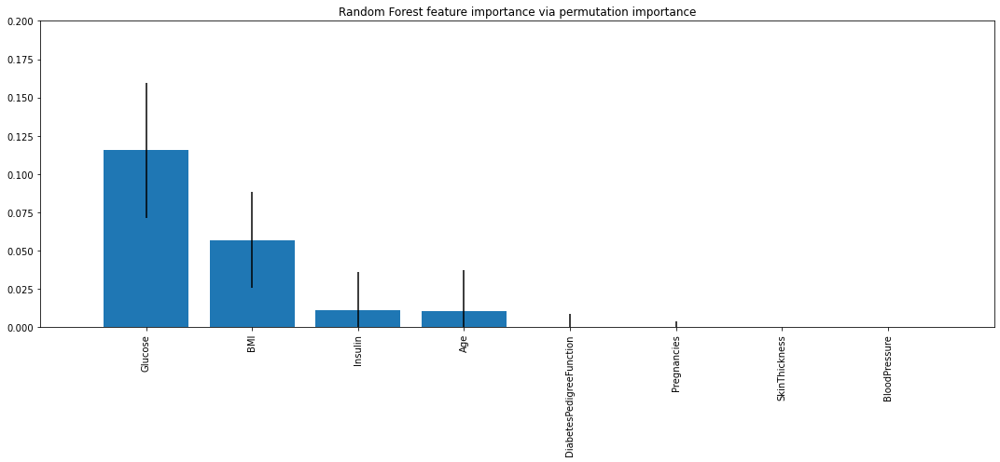

In [92]:
result = permutation_importance(
    estimator=baseline_model,
    X=Xtest,
    y=ytest,
    scoring='f1',
    n_repeats=200,
    random_state=np.random.seed(13)
)


indices = np.argsort(result['importances_mean'])[::-1]

plt.figure(figsize=(15,7))
plt.title("Random Forest feature importance via permutation importance")
plt.bar(
    range(X.shape[1]),
    result['importances_mean'][indices],
    yerr=result['importances_std'][indices]
)

plt.xticks(range(X.shape[1]), df.columns[:-1][indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.show()


In [94]:
perm_importance = pd.DataFrame({'Features': Xtrain.columns[indices]})

f1 = []
fs_model = RandomForestClassifier(random_state=np.random.seed(13))
for i in range(1,9):
    fs_model.fit(Xtrain.iloc[:,indices[:i]], ytrain)
    f1.append(f1_score(ytest, fs_model.predict(Xtest.iloc[:,indices[:i]])))
perm_importance['F1_perm'] = f1
perm_importance

,Features,F1_perm
0,Glucose,0.518519
1,BMI,0.577778
2,Insulin,0.539683
3,Age,0.607407
4,DiabetesPedigreeFunction,0.645669
5,Pregnancies,0.656000
6,SkinThickness,0.650794
7,BloodPressure,0.611570


[Code Source](https://github.com/rasbt/stat451-machine-learning-fs21/blob/main/13-feature-selection/05_permutation-importance.ipynb)

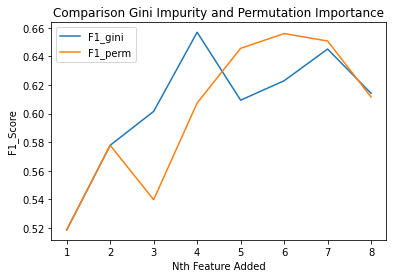

In [102]:
sns.lineplot(x=range(1,9), y=gini_importance.F1_gini)
sns.lineplot(x=range(1,9), y=perm_importance.F1_perm)
plt.title('Comparison Gini Impurity and Permutation Importance')
plt.xlabel('Nth Feature Added')
plt.ylabel('F1_Score')
plt.legend(labels=['F1_gini', 'F1_perm'], loc='best')

In this graph we are comparing the results of forward selection while using gini impurity and permutation as a basis for feature importance. The x-axis is not labeled as the actual labels are different. This graph is comparing how the model performs on forward selection with the two orders of importance. Using permutation importance is a more effective representation of importance in this case as it focuses on predictive power. As a result I will be using permutation importance with the first 6 most important features; Glucose, BMI, Insulin, Age, Diabetes Pedigree Function and Pregnancies.

In [113]:
Xtrain, Xtest = Xtrain[perm_importance.Features[:6]], Xtest[perm_importance.Features[:6]]

### Grid Search

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline

# Create a based model
grid_model = RandomForestClassifier(random_state=np.random.seed(13))

param_grid = {
    'bootstrap': [True],
    'max_depth': range(100, 601, 100),
    'max_features': range(2,5),
    'min_samples_split': range(2,5),
    'n_estimators': range(50, 651, 100)}

# Instantiate the grid search model
grid = GridSearchCV(grid_model, param_grid = param_grid, 
                    cv = 3, n_jobs = -1, verbose = 2, scoring='f1')

grid.fit(Xtrain, ytrain)

print('Best params:', grid.best_params_)
print('Best F1:', grid.best_score_)
grid_model = grid.best_estimator_
print('Test F1:', f1_score(ytest, grid_model.predict(Xtest)))

Fitting 3 folds for each of 378 candidates, totalling 1134 fits


Based on the results of the Grid Search, we can see that the fit is generalizable to unseen data. The best result for the validation set was 67.6%, and the test score was 68.8%. The increase is likely due to chance but what we are focusing on is that it performed just as well on the test set as it did on the validation. We will

## Classification using AutoML <a class="anchor" id="automl"></a>

In [63]:
#pip install pycaret